In [74]:
import sys
sys.path.append('.conda/envs/shear/lib/python3.9/site-packages/')

import numpy as np
import astropy.io.fits as pf
import pylab as mplot
import yaml
import h5py
import healpy as hp
import healsparse as hs
import scipy
from scipy import interpolate
from scipy.optimize import curve_fit


%pylab inline

%pylab is deprecated, use %matplotlib inline and import the required libraries.
Populating the interactive namespace from numpy and matplotlib


## Instructions

This notebook tries to make mean shear vs. SP map plots, fits a line and returns the slope and intercept

We need these maps

From shear cat
* T ratio 
* s/n
* (PSF e1)
* (PSF e2)

From Peter’s maps
* Depth i
* Brightness i
* Exp time i
* Airmass i
* Seeing i


In [2]:
tag = '0613'
project_dir = '/project/chihway/data/decade/'

## Make shear maps

In [3]:
# pixelate shear into 4096 maps, use v2 weights

In [4]:
# first get mask total

with h5py.File(project_dir+'metacal_gold_combined_2023'+tag+'.hdf', 'r') as h5r:
    size_ratio = h5r['mcal_T_ratio_noshear'][:]
    s2n = h5r['mcal_s2n_noshear'][:]
    sg = h5r['sg_bdf'][:] 
    fg = h5r['FLAGS_FOREGROUND'][:] 
    T = h5r['mcal_T_noshear'][:]
    mcal_flags = h5r['mcal_flags'][:]
    g1, g2  = h5r['mcal_g_noshear'][:].T
    flux_r, flux_i, flux_z = h5r['mcal_flux_noshear'][:].T

mag_r = -2.5*np.log10(flux_r)+30
mag_i = -2.5*np.log10(flux_i)+30
mag_z = -2.5*np.log10(flux_z)+30

# PZ mask
mcal_pz_mask = ((mag_i < 23.5) & (mag_i > 18) & 
                    (mag_r < 26)   & (mag_r > 15) & 
                    (mag_z < 26)   & (mag_z > 15) & 
                    (mag_r - mag_i < 4)   & (mag_r - mag_i > -1.5) & 
                    (mag_i - mag_z < 4)   & (mag_i - mag_z > -1.5))

# Metacal cuts based on DES Y3 ones (from here: https://des.ncsa.illinois.edu/releases/y3a2/Y3key-catalogs)
SNR_Mask   = (s2n > 10) & (s2n < 1000)
Tratio_Mask= size_ratio > 0.5
T_Mask = T < 10
Flag_Mask = (mcal_flags == 0)
Other_Mask = np.invert((T > 2) & (s2n < 30)) & np.invert((np.log10(T) < (22.25 - mag_r)/3.5) & (g1**2 + g2**2 > 0.8**2))
SG_Mask = (sg>=4)
FG_Mask = (fg==0)

mask_total = mcal_pz_mask & SNR_Mask & Tratio_Mask & T_Mask & Flag_Mask & Other_Mask & SG_Mask & FG_Mask

del size_ratio, s2n, sg, fg, T, mcal_flags, g1, g2, flux_r, flux_i, flux_z, mag_r, mag_i, mag_z
del mcal_pz_mask, SNR_Mask, Tratio_Mask, T_Mask, Flag_Mask, Other_Mask, SG_Mask

/scratch/local/jobs/6486989/ipykernel_2812670/2547016843.py:13: RuntimeWarning: invalid value encountered in log10
  mag_r = -2.5*np.log10(flux_r)+30
/scratch/local/jobs/6486989/ipykernel_2812670/2547016843.py:14: RuntimeWarning: invalid value encountered in log10
  mag_i = -2.5*np.log10(flux_i)+30
/scratch/local/jobs/6486989/ipykernel_2812670/2547016843.py:15: RuntimeWarning: invalid value encountered in log10
  mag_z = -2.5*np.log10(flux_z)+30
/scratch/local/jobs/6486989/ipykernel_2812670/2547016843.py:29: RuntimeWarning: invalid value encountered in log10
  Other_Mask = np.invert((T > 2) & (s2n < 30)) & np.invert((np.log10(T) < (22.25 - mag_r)/3.5) & (g1**2 + g2**2 > 0.8**2))


In [7]:
with h5py.File(project_dir+'metacal_gold_combined_2023'+tag+'.hdf', 'r') as h5r:
    ra = h5r['RA'][:] #[mask_total]
    dec = h5r['DEC'][:] #[mask_total]
    g1, g2  = h5r['mcal_g_noshear'][:].T #[:][mask_total].T
    w2 =  h5r['mcal_g_w_v2'][:] #[mask_total] # we will use v2 weights

In [8]:
ra = ra[mask_total]
dec = dec[mask_total]
w2 = w2[mask_total]
g1 = g1[mask_total]
g2 = g2[mask_total]


In [9]:
# copiped from neff notebook
R11 = 0.7443824304923087 
R11s = 0.047189013967600654
R22 = 0.7455737932558067 
R22s = 0.04767254335307269
R11tot = 0.7915714444599093 
R22tot = 0.7932463366088794

In [11]:
nside = 4096
map_counts = np.zeros(hp.nside2npix(nside))
map_weight = np.zeros(hp.nside2npix(nside))
map_gal_e1 = np.zeros(hp.nside2npix(nside))
map_gal_e2 = np.zeros(hp.nside2npix(nside))

phi = ra/180*np.pi
theta = (90.-dec)/180*np.pi

pix = hp.ang2pix(nside, theta, phi)

In [13]:
for i in range(len(pix)):
    map_counts[pix[i]] += 1
    map_weight[pix[i]] += w2[i]
    map_gal_e1[pix[i]] += (g1[i]/R11tot)*w2[i]
    map_gal_e2[pix[i]] += (g2[i]/R22tot)*w2[i]

In [14]:
def divide_map(map1, map2):
    outmap = map1.copy()
    outmap[map2>0] /= map2[map2>0]
    outmap[map2==0] = hp.UNSEEN
    return outmap

In [4]:
# save g1, g2, counts, weights maps
map_dir = '/project/chihway/data/decade/SP_maps/mcal/'


In [ ]:
hp.write_map(map_dir+'ncounts_2023'+tag+'.fits', map_counts, overwrite=True)
hp.write_map(map_dir+'g1_2023'+tag+'.fits', divide_map(map_gal_e1,map_weight), overwrite=True)
hp.write_map(map_dir+'g2_2023'+tag+'.fits', divide_map(map_gal_e2,map_weight), overwrite=True)
hp.write_map(map_dir+'weights_2023'+tag+'.fits', map_weight, overwrite=True)


<Figure size 640x480 with 0 Axes>

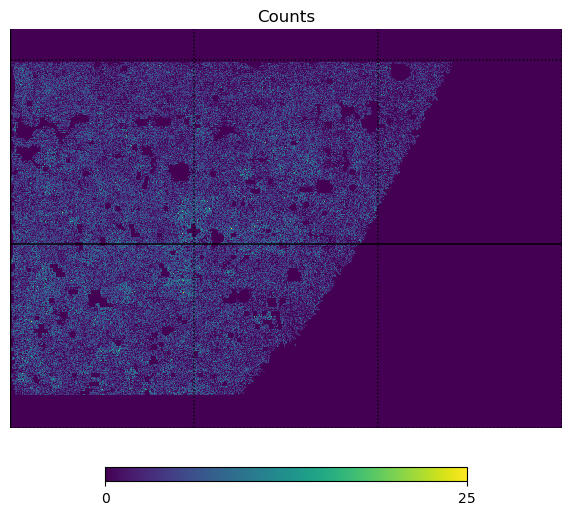

In [19]:
mplot.figure()
hp.cartview(map_counts, lonra=[90,180], latra=[-30,35], title='Counts')
hp.graticule()
mplot.show()


<Figure size 640x480 with 0 Axes>

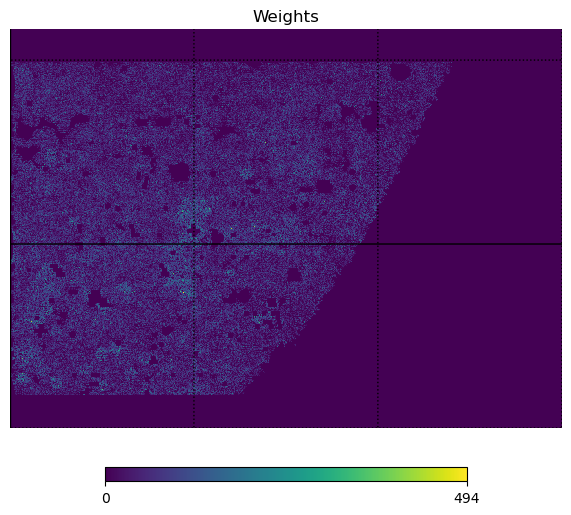

In [20]:
mplot.figure()
hp.cartview(map_weight, lonra=[90,180], latra=[-30,35], title='Weights')
hp.graticule()
mplot.show()


<Figure size 640x480 with 0 Axes>

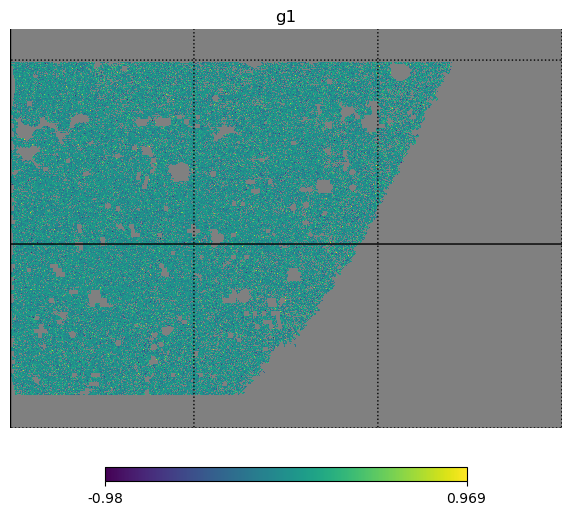

In [21]:
mplot.figure()
hp.cartview(divide_map(map_gal_e1,map_weight), lonra=[90,180], latra=[-30,35], title='g1')
hp.graticule()
mplot.show()


<Figure size 640x480 with 0 Axes>

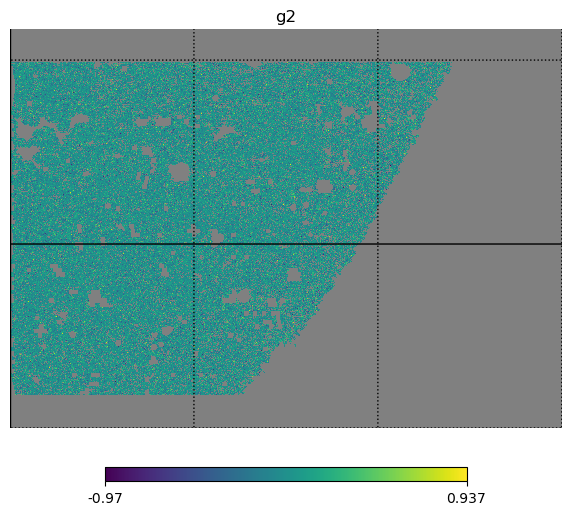

In [22]:
mplot.figure()
hp.cartview(divide_map(map_gal_e2,map_weight), lonra=[90,180], latra=[-30,35], title='g2')
hp.graticule()
mplot.show()


## Get all the maps, apply the same mask, plot in nside 4096

delve_dr3_1_1_r_airmass_wmean.hs


<Figure size 640x480 with 0 Axes>

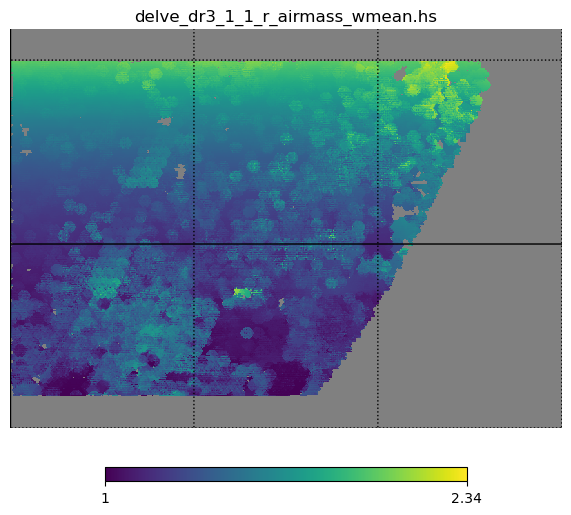

setting the output map dtype to [dtype('float64')]


delve_dr3_1_1_g_airmass_wmean.hs


<Figure size 640x480 with 0 Axes>

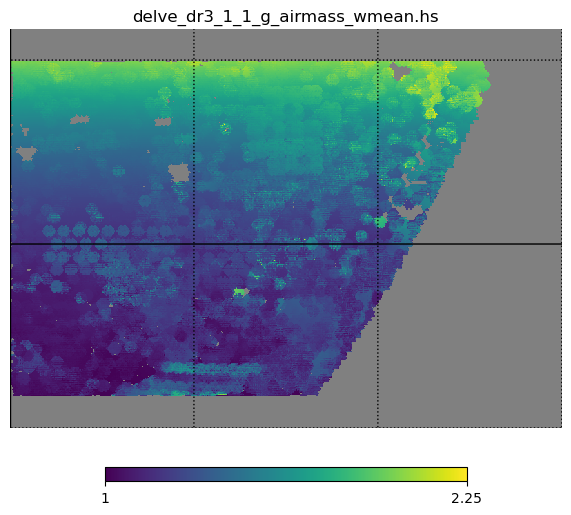

setting the output map dtype to [dtype('float64')]


delve_dr3_1_1_i_airmass_wmean.hs


<Figure size 640x480 with 0 Axes>

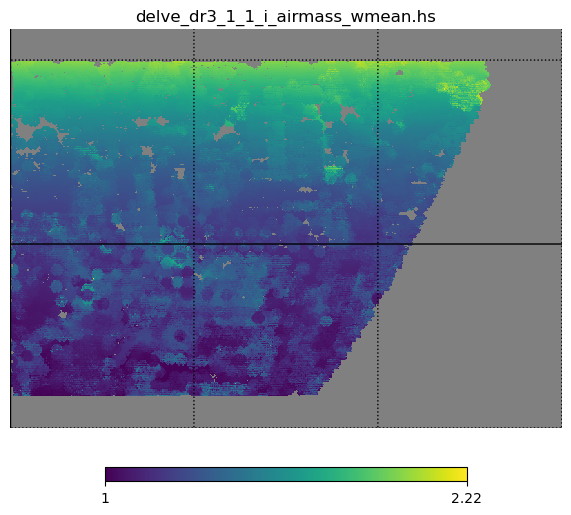

setting the output map dtype to [dtype('float64')]


delve_dr3_1_1_z_airmass_wmean.hs


<Figure size 640x480 with 0 Axes>

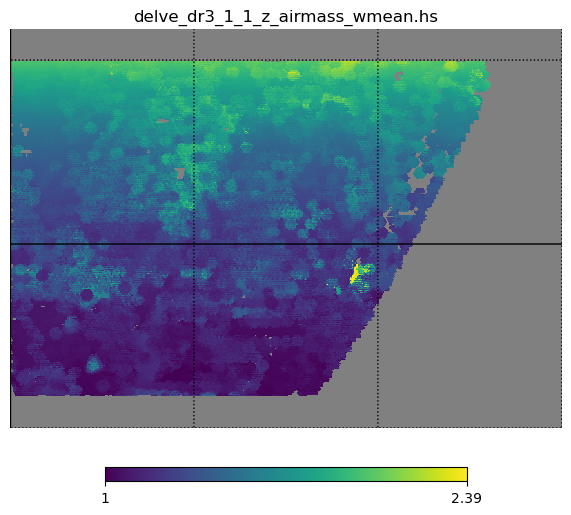

setting the output map dtype to [dtype('float64')]


delve_dr3_1_1_z_dcr_ddec_wmean.hs


<Figure size 640x480 with 0 Axes>

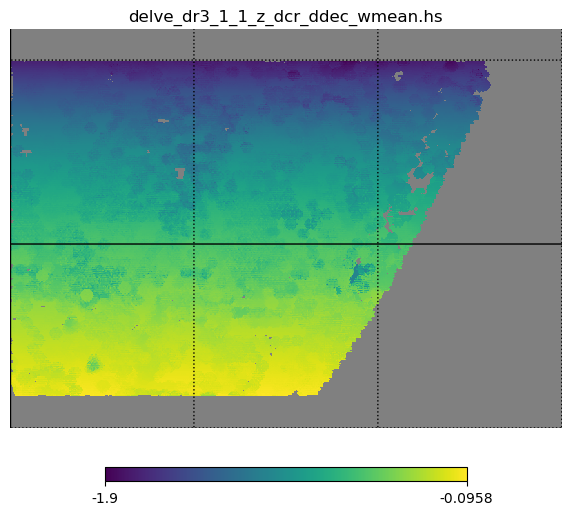

setting the output map dtype to [dtype('float64')]


delve_dr3_1_1_g_dcr_e1_wmean.hs


<Figure size 640x480 with 0 Axes>

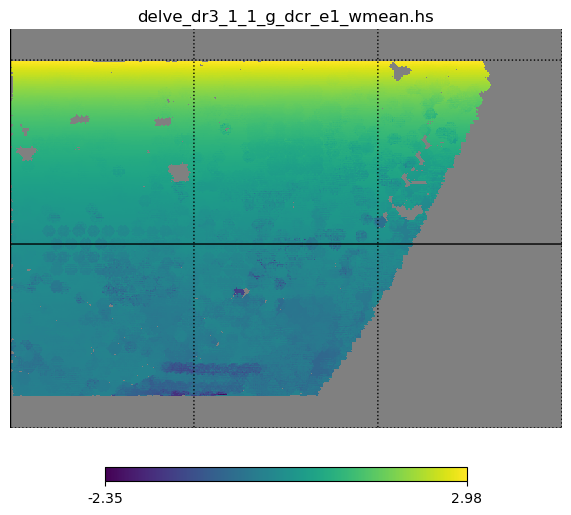

setting the output map dtype to [dtype('float64')]


delve_dr3_1_1_i_dcr_e2_wmean.hs


<Figure size 640x480 with 0 Axes>

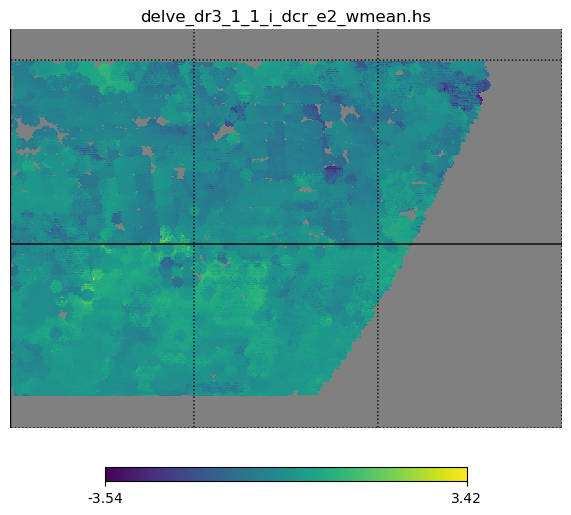

setting the output map dtype to [dtype('float64')]


delve_dr3_1_1_z_dcr_e1_wmean.hs


<Figure size 640x480 with 0 Axes>

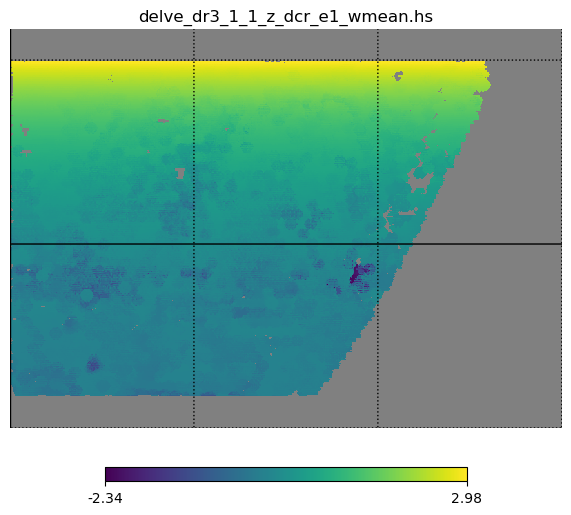

setting the output map dtype to [dtype('float64')]


delve_dr3_1_1_i_dcr_dra_wmean.hs


<Figure size 640x480 with 0 Axes>

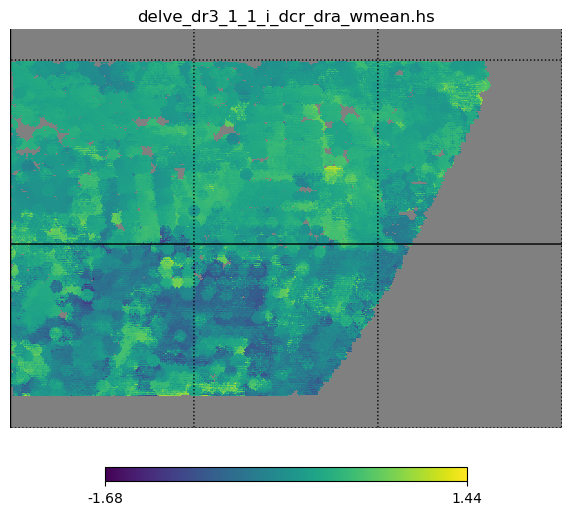

setting the output map dtype to [dtype('float64')]


delve_dr3_1_1_i_dcr_e1_wmean.hs


<Figure size 640x480 with 0 Axes>

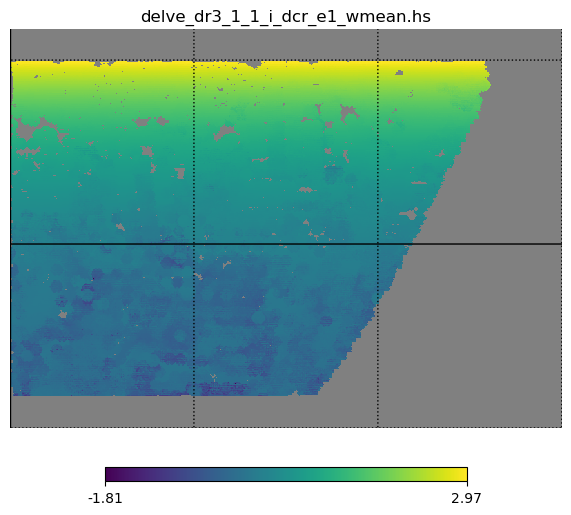

setting the output map dtype to [dtype('float64')]


delve_dr3_1_1_g_dcr_dra_wmean.hs


<Figure size 640x480 with 0 Axes>

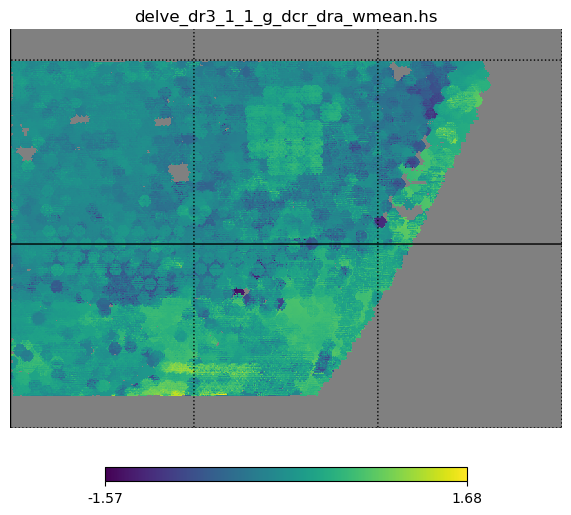

setting the output map dtype to [dtype('float64')]


delve_dr3_1_1_r_dcr_ddec_wmean.hs


<Figure size 640x480 with 0 Axes>

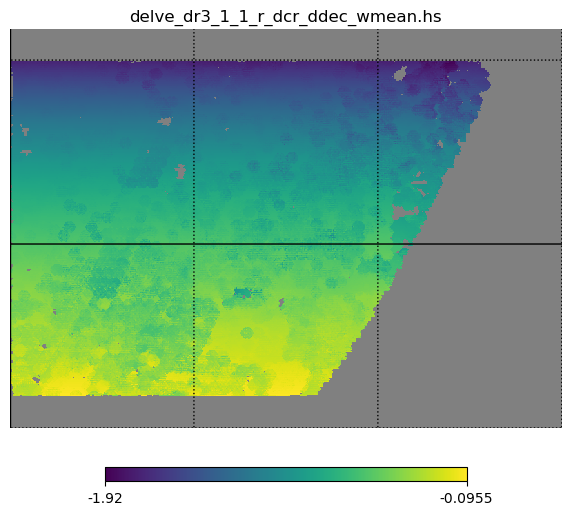

setting the output map dtype to [dtype('float64')]


delve_dr3_1_1_i_dcr_ddec_wmean.hs


<Figure size 640x480 with 0 Axes>

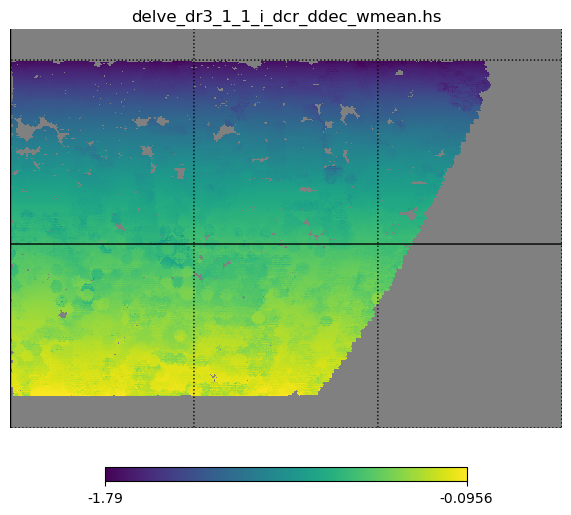

setting the output map dtype to [dtype('float64')]


delve_dr3_1_1_r_dcr_dra_wmean.hs


<Figure size 640x480 with 0 Axes>

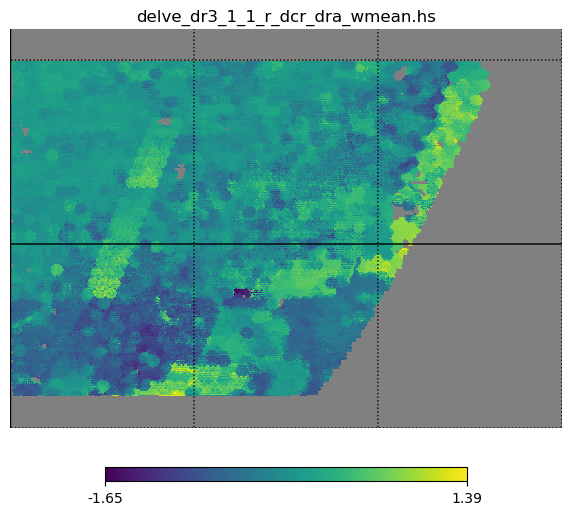

setting the output map dtype to [dtype('float64')]


delve_dr3_1_1_g_dcr_ddec_wmean.hs


<Figure size 640x480 with 0 Axes>

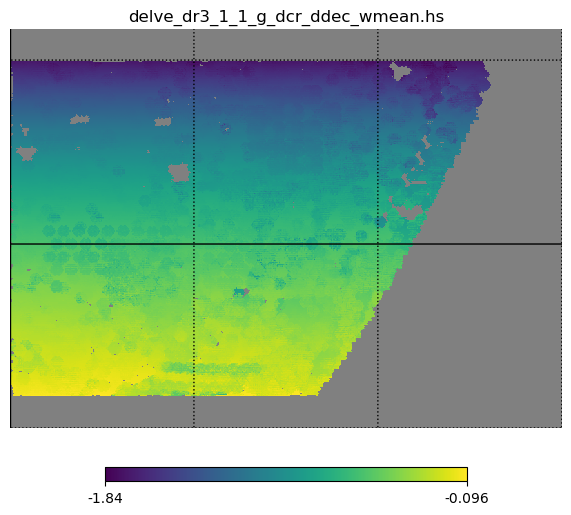

setting the output map dtype to [dtype('float64')]


delve_dr3_1_1_z_dcr_e2_wmean.hs


<Figure size 640x480 with 0 Axes>

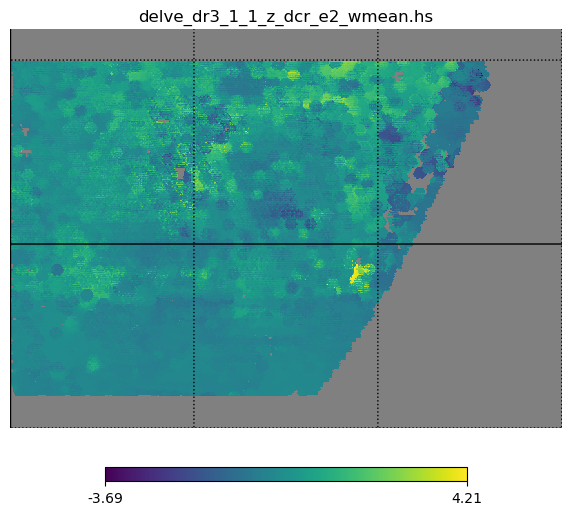

setting the output map dtype to [dtype('float64')]


delve_dr3_1_1_g_dcr_e2_wmean.hs


<Figure size 640x480 with 0 Axes>

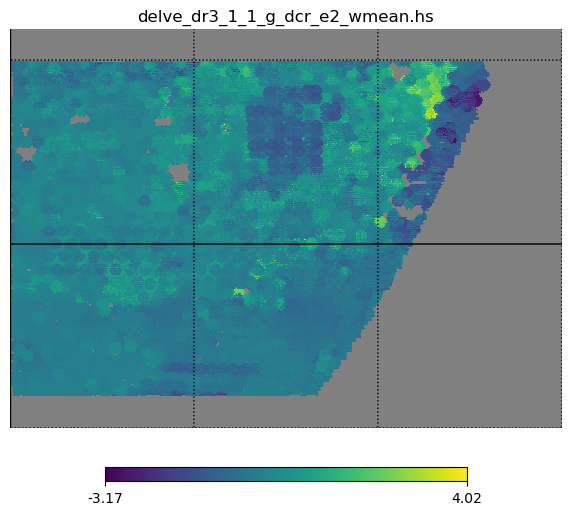

setting the output map dtype to [dtype('float64')]


delve_dr3_1_1_z_dcr_dra_wmean.hs


<Figure size 640x480 with 0 Axes>

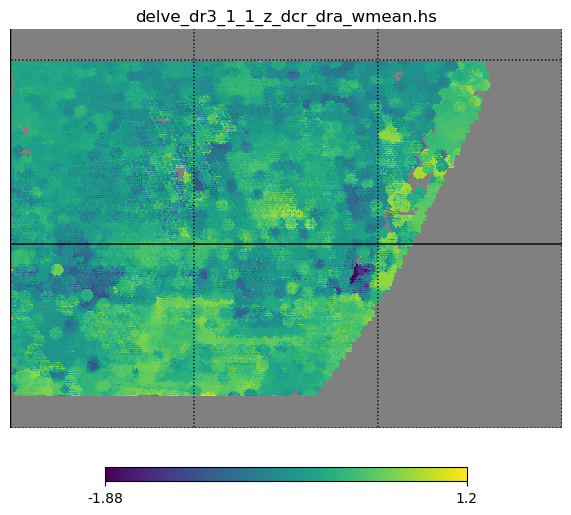

setting the output map dtype to [dtype('float64')]


delve_dr3_1_1_r_dcr_e2_wmean.hs


<Figure size 640x480 with 0 Axes>

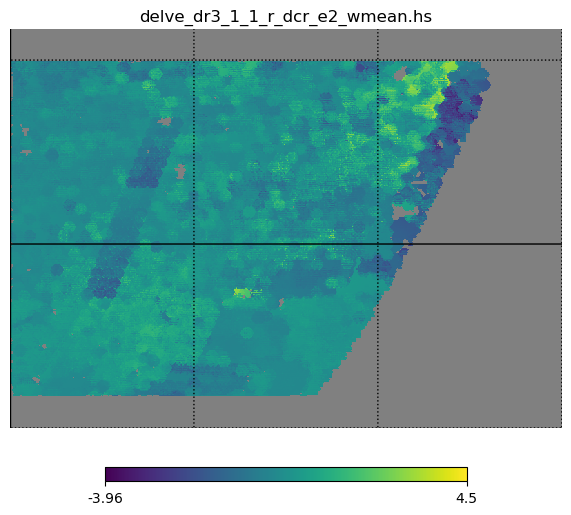

setting the output map dtype to [dtype('float64')]


delve_dr3_1_1_r_dcr_e1_wmean.hs


<Figure size 640x480 with 0 Axes>

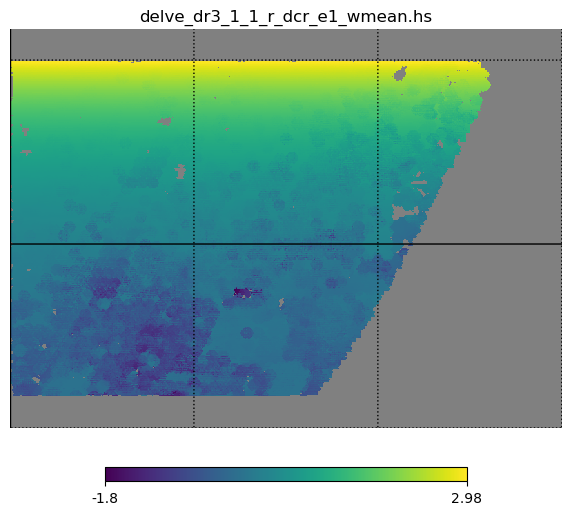

setting the output map dtype to [dtype('float64')]


delve_dr3_1_1_i_exptime_sum.hs


<Figure size 640x480 with 0 Axes>

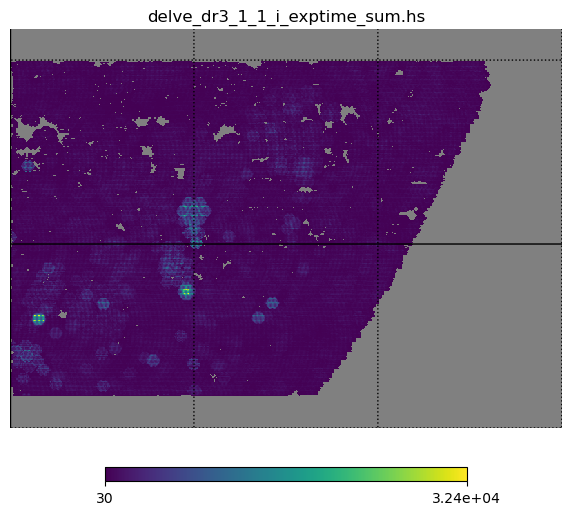

setting the output map dtype to [dtype('float64')]


delve_dr3_1_1_g_exptime_sum.hs


<Figure size 640x480 with 0 Axes>

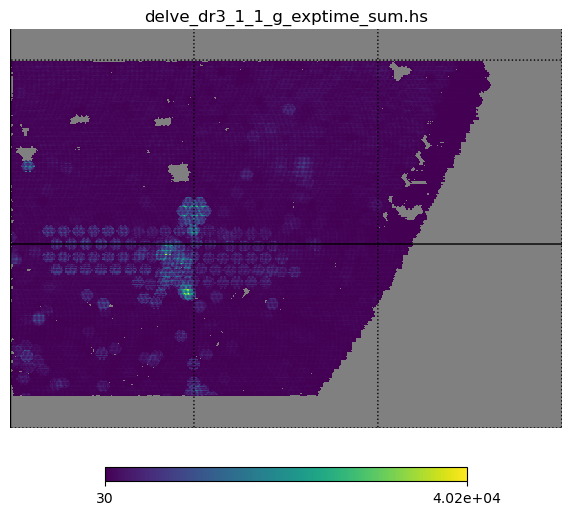

setting the output map dtype to [dtype('float64')]


delve_dr3_1_1_z_exptime_sum.hs


<Figure size 640x480 with 0 Axes>

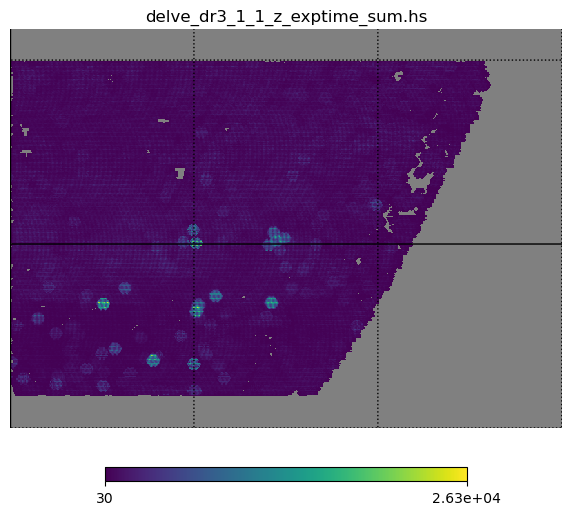

setting the output map dtype to [dtype('float64')]


delve_dr3_1_1_r_exptime_sum.hs


<Figure size 640x480 with 0 Axes>

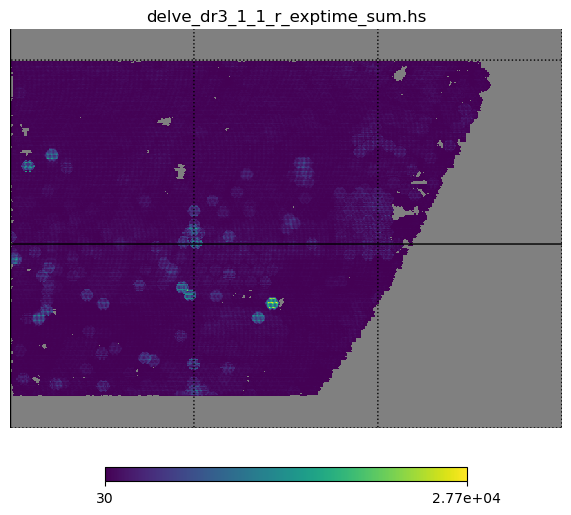

setting the output map dtype to [dtype('float64')]


delve_dr3_1_1_i_fwhm_wmean.hs


<Figure size 640x480 with 0 Axes>

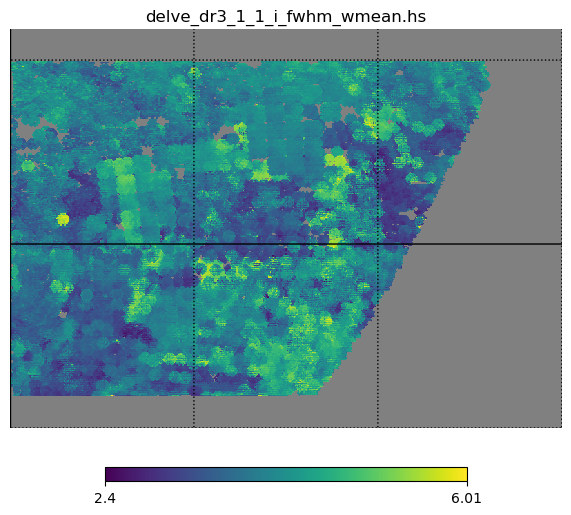

setting the output map dtype to [dtype('float64')]


delve_dr3_1_1_g_fwhm_wmean.hs


<Figure size 640x480 with 0 Axes>

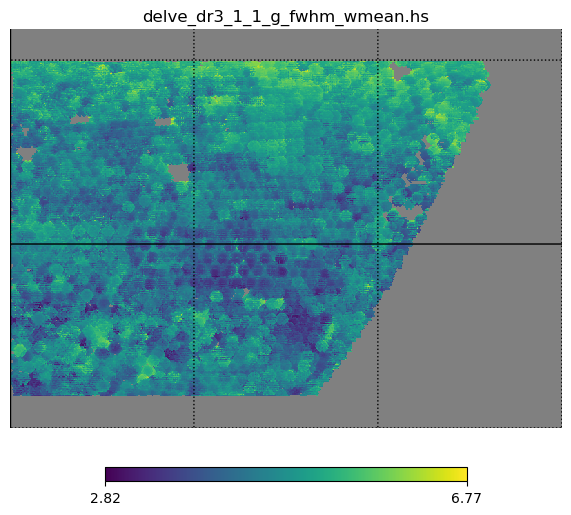

setting the output map dtype to [dtype('float64')]


delve_dr3_1_1_z_fwhm_wmean.hs


<Figure size 640x480 with 0 Axes>

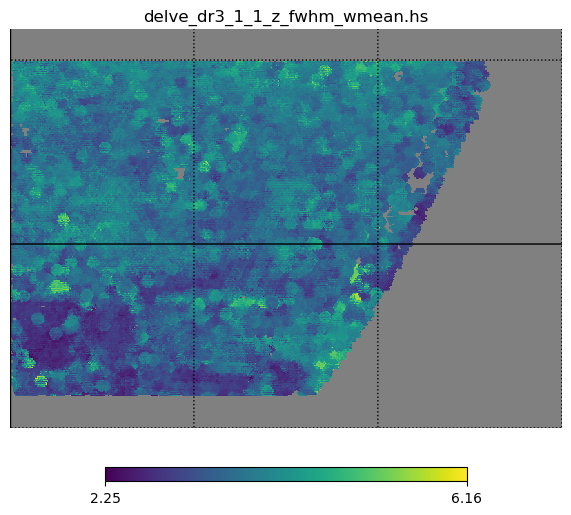

setting the output map dtype to [dtype('float64')]


delve_dr3_1_1_r_fwhm_wmean.hs


<Figure size 640x480 with 0 Axes>

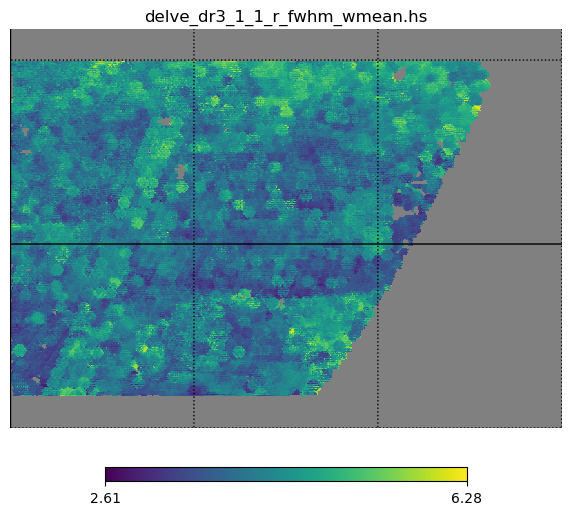

setting the output map dtype to [dtype('float64')]


delve_dr3_1_1_g_maglim_wmean.hs


<Figure size 640x480 with 0 Axes>

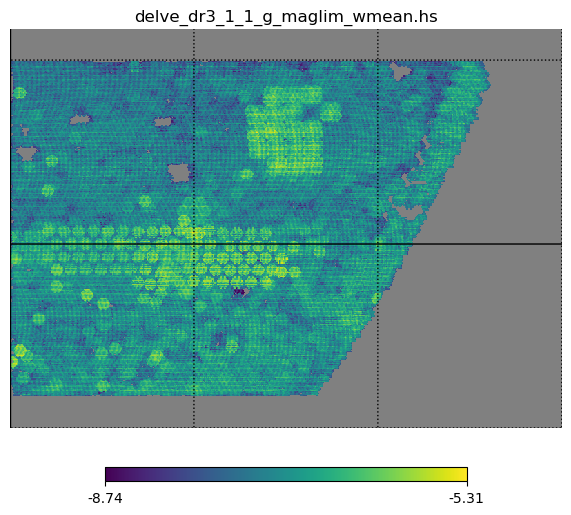

setting the output map dtype to [dtype('float64')]


delve_dr3_1_1_z_maglim_wmean.hs


<Figure size 640x480 with 0 Axes>

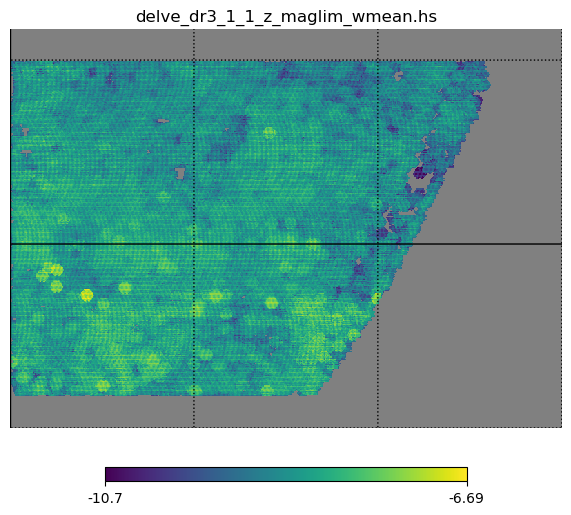

setting the output map dtype to [dtype('float64')]


delve_dr3_1_1_i_maglim_wmean.hs


<Figure size 640x480 with 0 Axes>

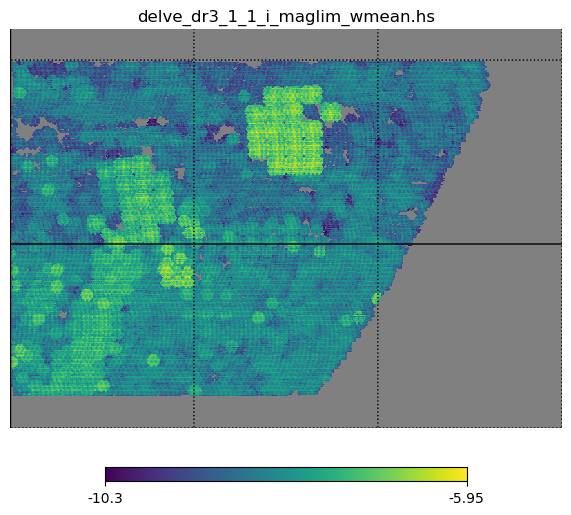

setting the output map dtype to [dtype('float64')]


delve_dr3_1_1_r_maglim_wmean.hs


<Figure size 640x480 with 0 Axes>

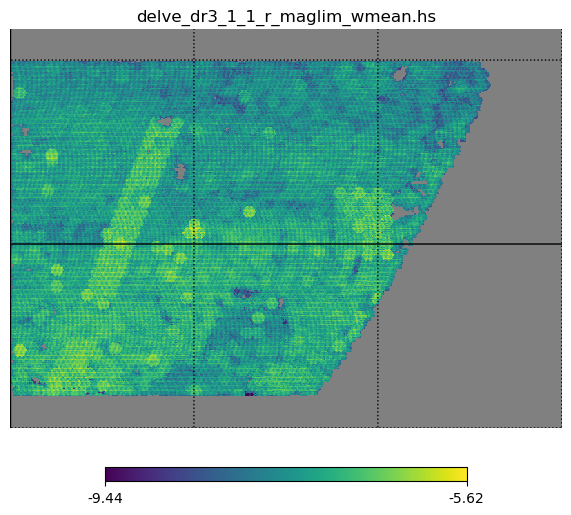

setting the output map dtype to [dtype('float64')]


delve_dr3_1_1_g_nexp_sum.hs


<Figure size 640x480 with 0 Axes>

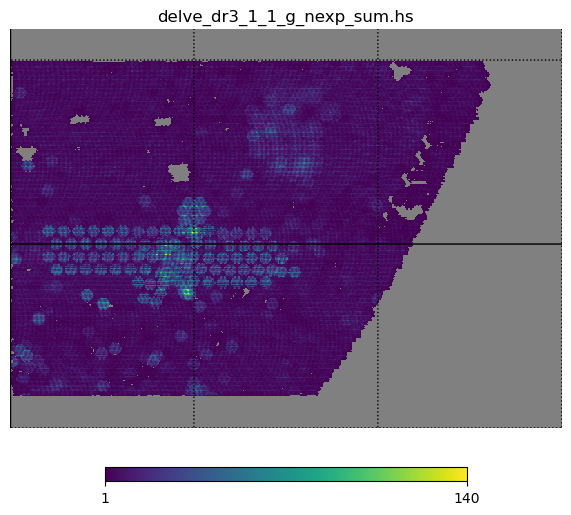

setting the output map dtype to [dtype('float64')]


delve_dr3_1_1_i_nexp_sum.hs


<Figure size 640x480 with 0 Axes>

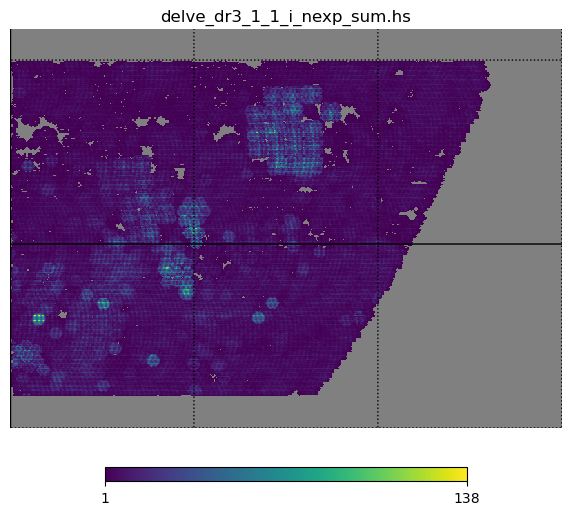

setting the output map dtype to [dtype('float64')]


delve_dr3_1_1_r_nexp_sum.hs


<Figure size 640x480 with 0 Axes>

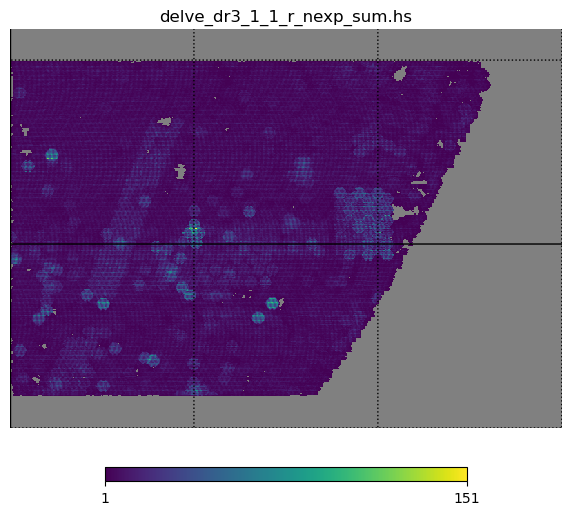

setting the output map dtype to [dtype('float64')]


delve_dr3_1_1_z_nexp_sum.hs


<Figure size 640x480 with 0 Axes>

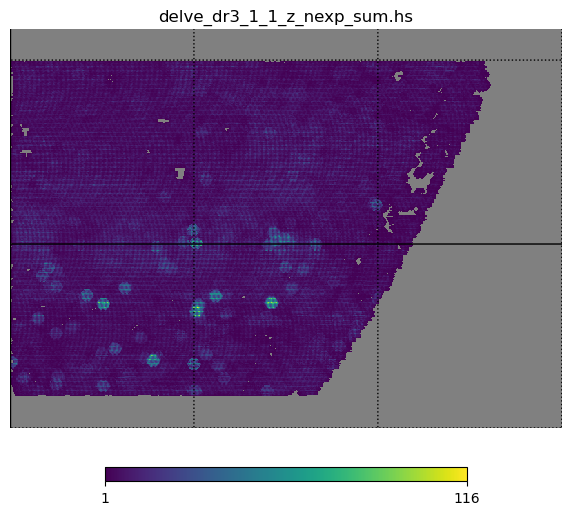

setting the output map dtype to [dtype('float64')]


delve_dr3_1_1_z_skybrite_wmean-scaled.hs


<Figure size 640x480 with 0 Axes>

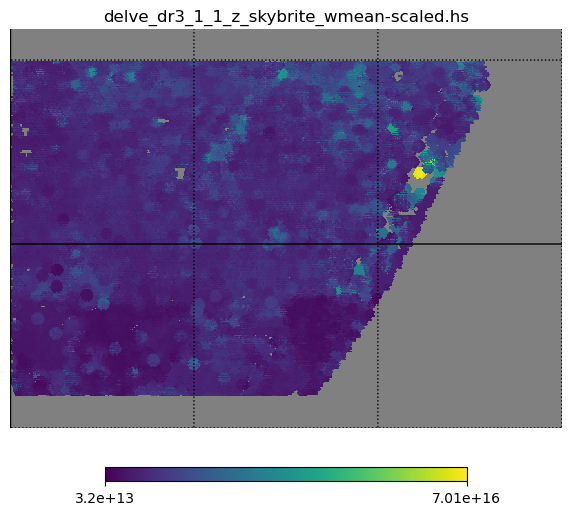

setting the output map dtype to [dtype('float64')]


delve_dr3_1_1_z_skybrite_wmean.hs


<Figure size 640x480 with 0 Axes>

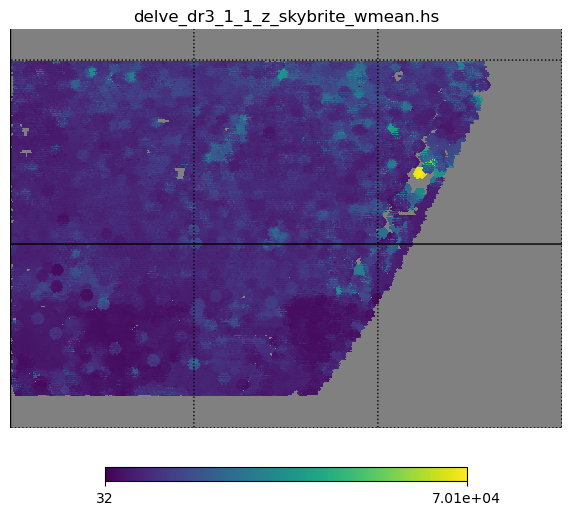

setting the output map dtype to [dtype('float64')]


delve_dr3_1_1_g_skybrite_wmean.hs


<Figure size 640x480 with 0 Axes>

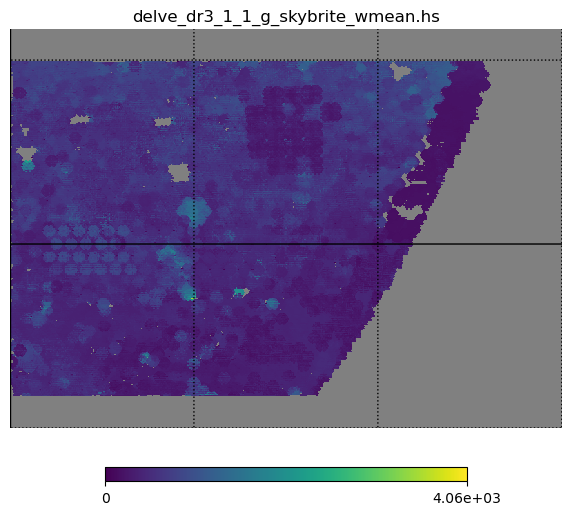

setting the output map dtype to [dtype('float64')]


delve_dr3_1_1_i_skybrite_wmean-scaled.hs


<Figure size 640x480 with 0 Axes>

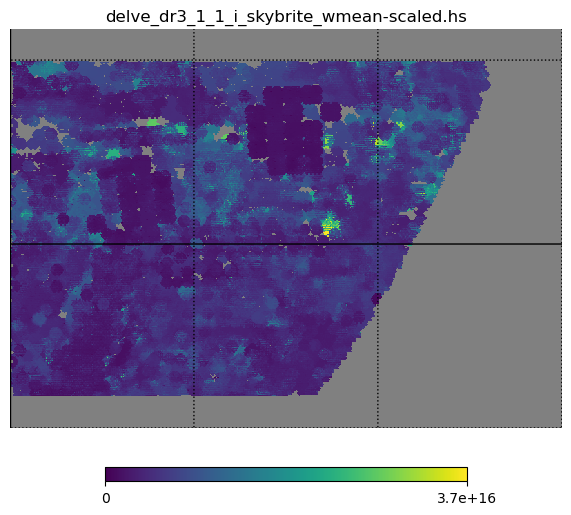

setting the output map dtype to [dtype('float64')]


delve_dr3_1_1_r_skybrite_wmean-scaled.hs


<Figure size 640x480 with 0 Axes>

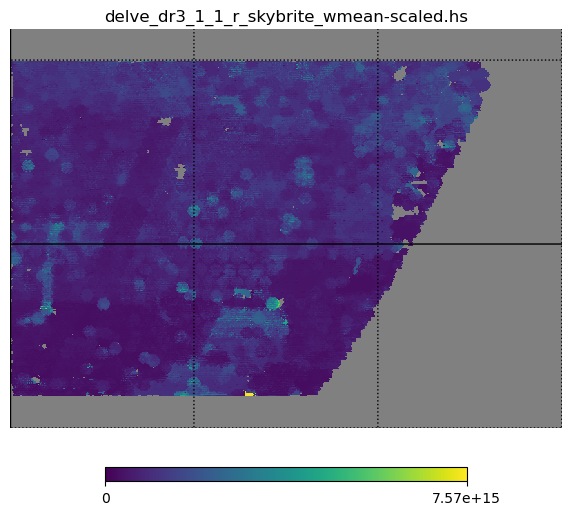

setting the output map dtype to [dtype('float64')]


delve_dr3_1_1_g_skybrite_wmean-scaled.hs


<Figure size 640x480 with 0 Axes>

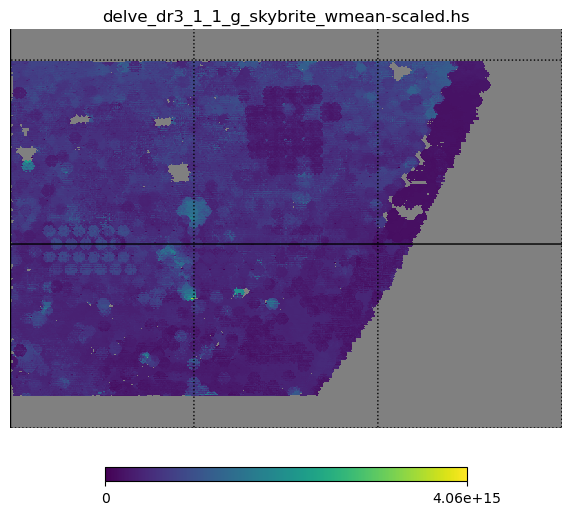

setting the output map dtype to [dtype('float64')]


delve_dr3_1_1_r_skybrite_wmean.hs


<Figure size 640x480 with 0 Axes>

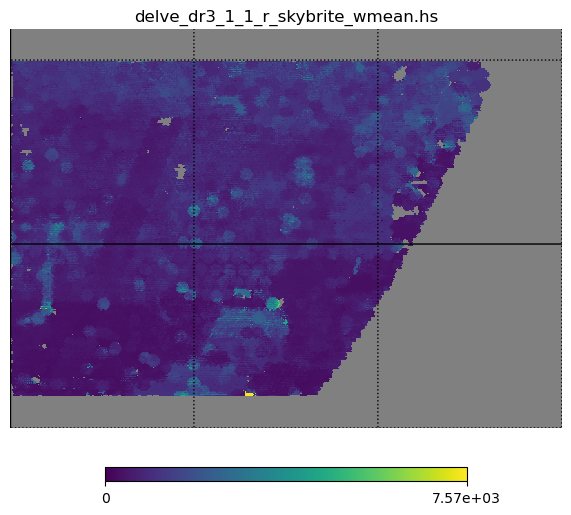

setting the output map dtype to [dtype('float64')]


delve_dr3_1_1_i_skybrite_wmean.hs


<Figure size 640x480 with 0 Axes>

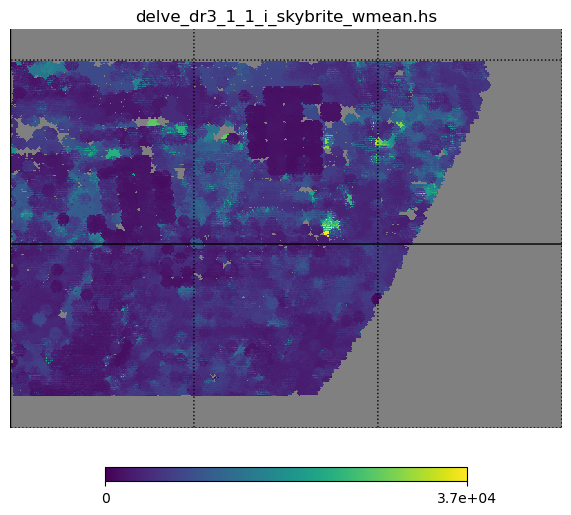

setting the output map dtype to [dtype('float64')]


delve_dr3_1_1_g_skysigma_wmean-scaled.hs


<Figure size 640x480 with 0 Axes>

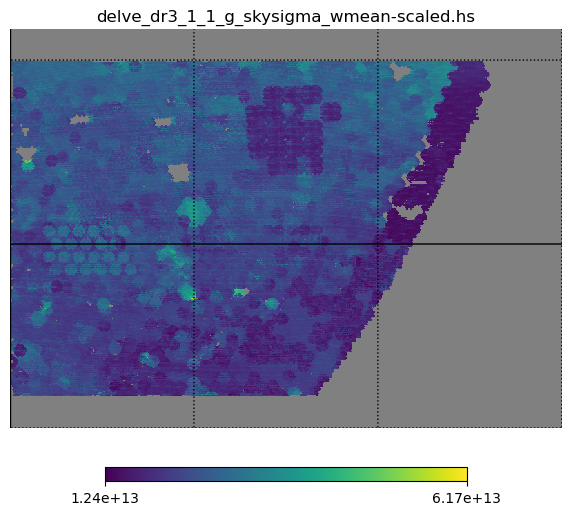

setting the output map dtype to [dtype('float64')]


delve_dr3_1_1_i_skysigma_wmean.hs


<Figure size 640x480 with 0 Axes>

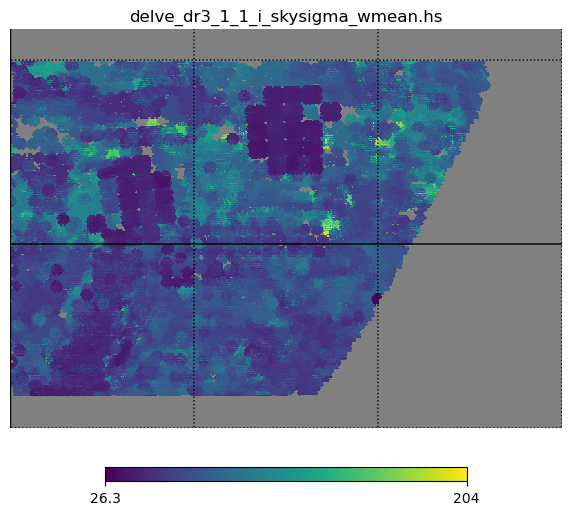

setting the output map dtype to [dtype('float64')]


delve_dr3_1_1_r_skysigma_wmean-scaled.hs


<Figure size 640x480 with 0 Axes>

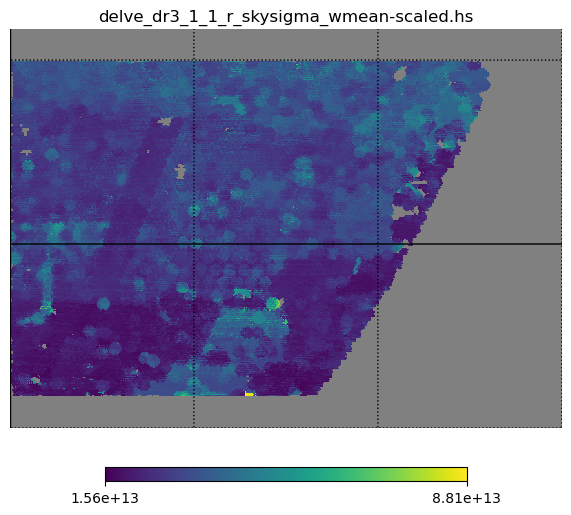

setting the output map dtype to [dtype('float64')]


delve_dr3_1_1_r_skysigma_wmean.hs


<Figure size 640x480 with 0 Axes>

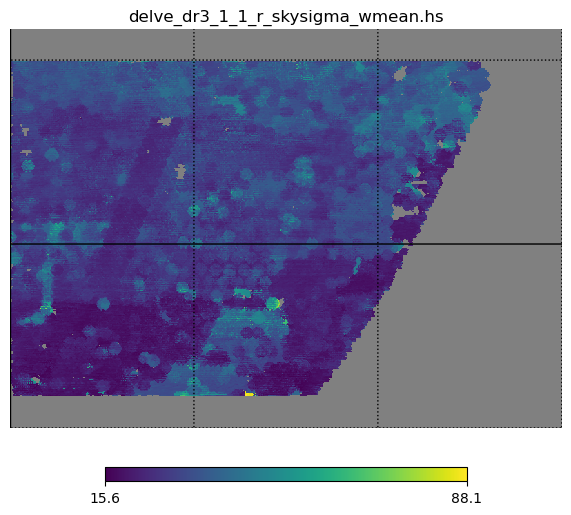

setting the output map dtype to [dtype('float64')]


delve_dr3_1_1_z_skysigma_wmean.hs


<Figure size 640x480 with 0 Axes>

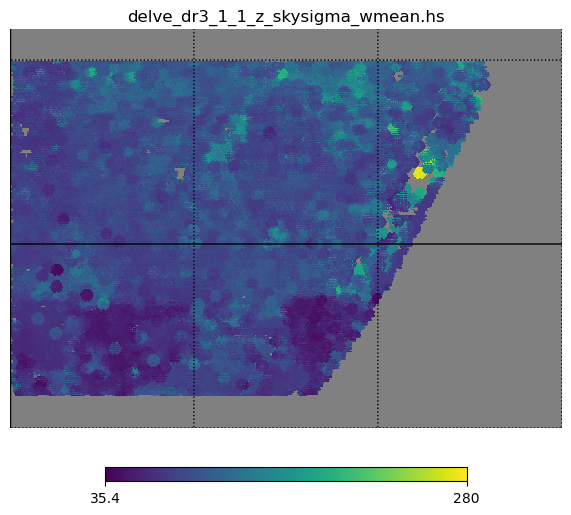

setting the output map dtype to [dtype('float64')]


delve_dr3_1_1_z_skysigma_wmean-scaled.hs


<Figure size 640x480 with 0 Axes>

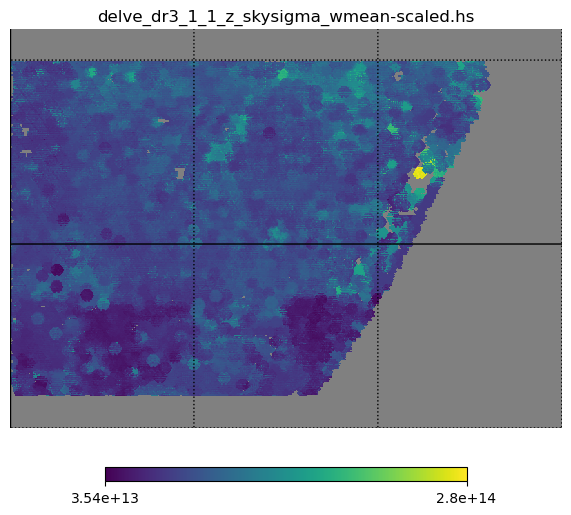

setting the output map dtype to [dtype('float64')]


delve_dr3_1_1_i_skysigma_wmean-scaled.hs


<Figure size 640x480 with 0 Axes>

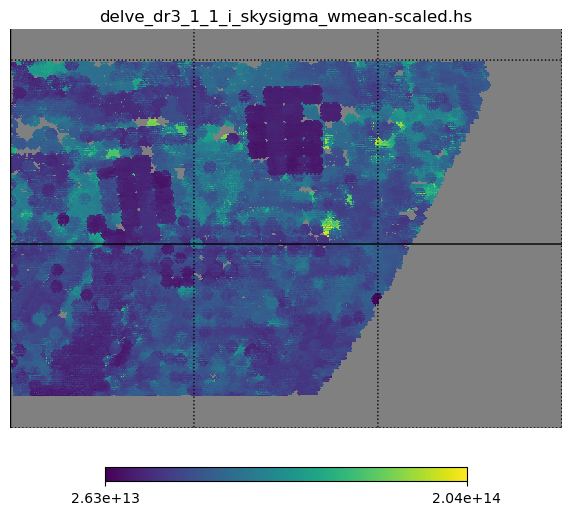

setting the output map dtype to [dtype('float64')]


delve_dr3_1_1_g_skysigma_wmean.hs


<Figure size 640x480 with 0 Axes>

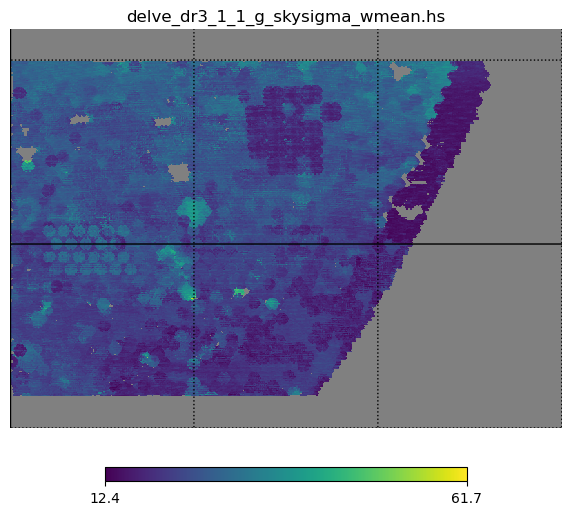

setting the output map dtype to [dtype('float64')]


In [17]:
Types = ['airmass', 'dcr', 'exptime', 'fwhm', 'maglim', 'nexp', 'skybrite', 'skysigma']

#coverage
import os
for SP in Types:
    file_list = os.listdir('/project/chihway/data/decade/SP_maps/'+SP)   
    for file_name in file_list:
        if file_name.endswith('.hs'):
            print(file_name)
            hsp_map = hs.HealSparseMap.read('/project/chihway/data/decade/SP_maps/'+SP+'/'+file_name)
            X = hsp_map.generate_healpix_map(nside=4096)
            mplot.figure()
            hp.cartview(X, nest=True, lonra=[90,180], latra=[-30,35], title=file_name)
            hp.graticule()
    #         hp.mollview(X, nest=True, Title=filename)
            mplot.show()
            hp.write_map('/project/chihway/data/decade/SP_maps/'+SP+'/'+file_name[:-3]+'.fits', X, overwrite=True)

    

## Now do mean shear as a function of X

In [5]:
ncount = hp.read_map(map_dir+'ncounts_2023'+tag+'.fits')
g1 = hp.read_map(map_dir+'g1_2023'+tag+'.fits')
g2 = hp.read_map(map_dir+'g2_2023'+tag+'.fits')

In [76]:
def line(b, x, a):
    return b * x + a

def fit_line(x, y, yerr):
    popt, cov = curve_fit(line, x, y, sigma=yerr)
    b = popt[0]
    a = popt[1]
    return b, a, cov

In [77]:
# hp.mollview(airmass_i)

In [99]:
def SP_vs_shear(g1_map, g2_map, SP_map, counts, tag):
    """
    all maps are already in healpix arrays
    """
    N = 50000
    mask = (counts > 0) * (SP_map != hp.UNSEEN)
    g1_map = g1_map[mask]
    g2_map = g2_map[mask]
    SP_map = SP_map[mask]
    
    ids = np.arange(len(SP_map))
    np.random.shuffle(ids)
    
#     mplot.scatter(SP_map[ids[:N]], g1_map[ids[:N]], marker='.', color='grey', alpha=0.01)
#     mplot.scatter(SP_map[ids[:N]], g2_map[ids[:N]], marker='.', color='grey', alpha=0.01)

    min_SP = np.percentile(SP_map, 0.1)
    max_SP = np.percentile(SP_map, 99.9)
    
    edges = np.linspace(min_SP,max_SP,41)
    mid_bin = 0.5*(edges[:-1]+edges[1:]) 
    inds = np.digitize(SP_map, edges)

    Mean1 = []
    Std1 = []
    Mean2 = []
    Std2 = []

    for i in range(40):
        Mean1.append(np.mean(g1_map[inds==i+1]))
        Std1.append(np.std(g1_map[inds==i+1])/np.sqrt(len(g1_map[inds==i+1])))
        Mean2.append(np.mean(g2_map[inds==i+1]))
        Std2.append(np.std(g2_map[inds==i+1])/np.sqrt(len(g2_map[inds==i+1])))
    
    Mean1 = np.array(Mean1); Std1 = np.array(Std1); Mean2 = np.array(Mean2); Std2 = np.array(Std2)
    
    mplot.figure(figsize=(6,4))
    mplot.xlabel(tag)
    mplot.errorbar(mid_bin, Mean1, yerr=Std1, color='orchid', lw=1, marker='.', fmt='.', capthick=0.8, capsize=2.2)
    mplot.errorbar(mid_bin*1.05, Mean2, yerr=Std2, color='skyblue', lw=1, marker='.', fmt='.', capthick=0.8, capsize=2.2)
    
    b1, a1, cov1 = fit_line(mid_bin, Mean1, Std1) 
    b2, a2, cov2 = fit_line(mid_bin, Mean2, Std2) 
    
    mplot.plot(mid_bin, b1*mid_bin+a1, c='darkmagenta', zorder=10)
    mplot.plot(mid_bin, b2*mid_bin+a2, c='steelblue', zorder=10)
    
    mplot.ylabel('mean g1/g2')
    mplot.xlim(min_SP-(max_SP-min_SP)*0.05, max_SP+(max_SP-min_SP)*0.05)
    mplot.ylim(-0.002,0.002)
    
    mplot.savefig('/project/chihway/data/decade/SP_maps/plots/'+tag+'.pdf', bbox_inches='tight')
    
    return b1, a1, cov1, b2, a2, cov2

/scratch/local/jobs/6486989/ipykernel_2814601/2747146253.py:39: UserWarning: marker is redundantly defined by the 'marker' keyword argument and the fmt string "." (-> marker='.'). The keyword argument will take precedence.
  mplot.errorbar(mid_bin, Mean1, yerr=Std1, color='orchid', lw=1, marker='.', fmt='.', capthick=0.8, capsize=2.2)
/scratch/local/jobs/6486989/ipykernel_2814601/2747146253.py:40: UserWarning: marker is redundantly defined by the 'marker' keyword argument and the fmt string "." (-> marker='.'). The keyword argument will take precedence.
  mplot.errorbar(mid_bin*1.05, Mean2, yerr=Std2, color='skyblue', lw=1, marker='.', fmt='.', capthick=0.8, capsize=2.2)
/scratch/local/jobs/6486989/ipykernel_2814601/2747146253.py:39: UserWarning: marker is redundantly defined by the 'marker' keyword argument and the fmt string "." (-> marker='.'). The keyword argument will take precedence.
  mplot.errorbar(mid_bin, Mean1, yerr=Std1, color='orchid', lw=1, marker='.', fmt='.', capthick=0

/scratch/local/jobs/6486989/ipykernel_2814601/2747146253.py:39: UserWarning: marker is redundantly defined by the 'marker' keyword argument and the fmt string "." (-> marker='.'). The keyword argument will take precedence.
  mplot.errorbar(mid_bin, Mean1, yerr=Std1, color='orchid', lw=1, marker='.', fmt='.', capthick=0.8, capsize=2.2)
/scratch/local/jobs/6486989/ipykernel_2814601/2747146253.py:40: UserWarning: marker is redundantly defined by the 'marker' keyword argument and the fmt string "." (-> marker='.'). The keyword argument will take precedence.
  mplot.errorbar(mid_bin*1.05, Mean2, yerr=Std2, color='skyblue', lw=1, marker='.', fmt='.', capthick=0.8, capsize=2.2)
/scratch/local/jobs/6486989/ipykernel_2814601/2747146253.py:39: UserWarning: marker is redundantly defined by the 'marker' keyword argument and the fmt string "." (-> marker='.'). The keyword argument will take precedence.
  mplot.errorbar(mid_bin, Mean1, yerr=Std1, color='orchid', lw=1, marker='.', fmt='.', capthick=0

/scratch/local/jobs/6486989/ipykernel_2814601/2747146253.py:39: UserWarning: marker is redundantly defined by the 'marker' keyword argument and the fmt string "." (-> marker='.'). The keyword argument will take precedence.
  mplot.errorbar(mid_bin, Mean1, yerr=Std1, color='orchid', lw=1, marker='.', fmt='.', capthick=0.8, capsize=2.2)
/scratch/local/jobs/6486989/ipykernel_2814601/2747146253.py:40: UserWarning: marker is redundantly defined by the 'marker' keyword argument and the fmt string "." (-> marker='.'). The keyword argument will take precedence.
  mplot.errorbar(mid_bin*1.05, Mean2, yerr=Std2, color='skyblue', lw=1, marker='.', fmt='.', capthick=0.8, capsize=2.2)
/scratch/local/jobs/6486989/ipykernel_2814601/2747146253.py:39: UserWarning: marker is redundantly defined by the 'marker' keyword argument and the fmt string "." (-> marker='.'). The keyword argument will take precedence.
  mplot.errorbar(mid_bin, Mean1, yerr=Std1, color='orchid', lw=1, marker='.', fmt='.', capthick=0

/scratch/local/jobs/6486989/ipykernel_2814601/2747146253.py:39: UserWarning: marker is redundantly defined by the 'marker' keyword argument and the fmt string "." (-> marker='.'). The keyword argument will take precedence.
  mplot.errorbar(mid_bin, Mean1, yerr=Std1, color='orchid', lw=1, marker='.', fmt='.', capthick=0.8, capsize=2.2)
/scratch/local/jobs/6486989/ipykernel_2814601/2747146253.py:40: UserWarning: marker is redundantly defined by the 'marker' keyword argument and the fmt string "." (-> marker='.'). The keyword argument will take precedence.
  mplot.errorbar(mid_bin*1.05, Mean2, yerr=Std2, color='skyblue', lw=1, marker='.', fmt='.', capthick=0.8, capsize=2.2)
/scratch/local/jobs/6486989/ipykernel_2814601/2747146253.py:39: UserWarning: marker is redundantly defined by the 'marker' keyword argument and the fmt string "." (-> marker='.'). The keyword argument will take precedence.
  mplot.errorbar(mid_bin, Mean1, yerr=Std1, color='orchid', lw=1, marker='.', fmt='.', capthick=0

/scratch/local/jobs/6486989/ipykernel_2814601/2747146253.py:39: UserWarning: marker is redundantly defined by the 'marker' keyword argument and the fmt string "." (-> marker='.'). The keyword argument will take precedence.
  mplot.errorbar(mid_bin, Mean1, yerr=Std1, color='orchid', lw=1, marker='.', fmt='.', capthick=0.8, capsize=2.2)
/scratch/local/jobs/6486989/ipykernel_2814601/2747146253.py:40: UserWarning: marker is redundantly defined by the 'marker' keyword argument and the fmt string "." (-> marker='.'). The keyword argument will take precedence.
  mplot.errorbar(mid_bin*1.05, Mean2, yerr=Std2, color='skyblue', lw=1, marker='.', fmt='.', capthick=0.8, capsize=2.2)


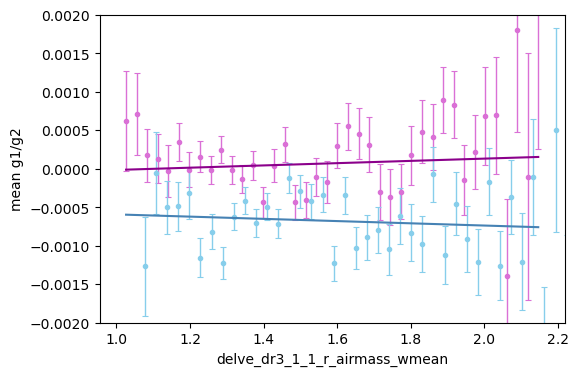

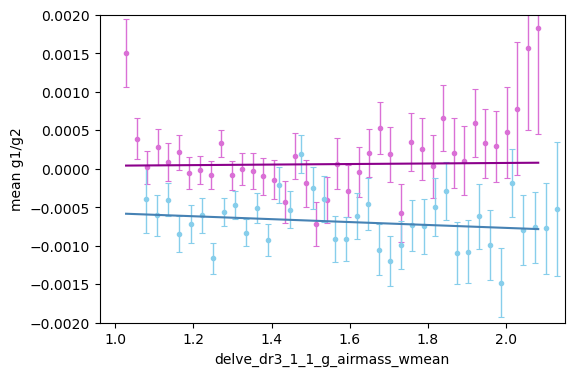

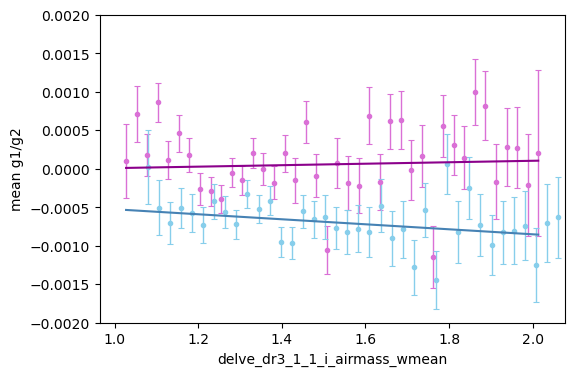

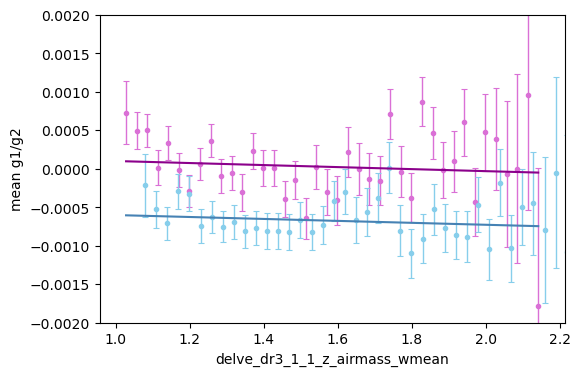

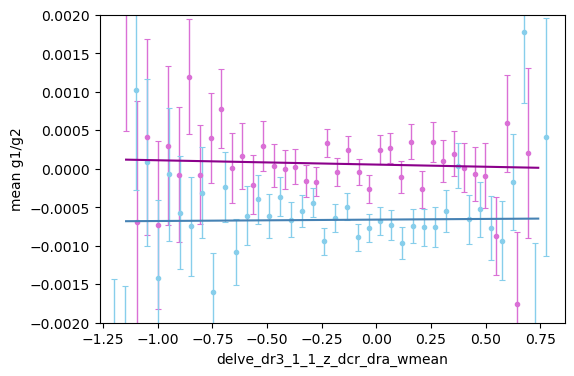

...

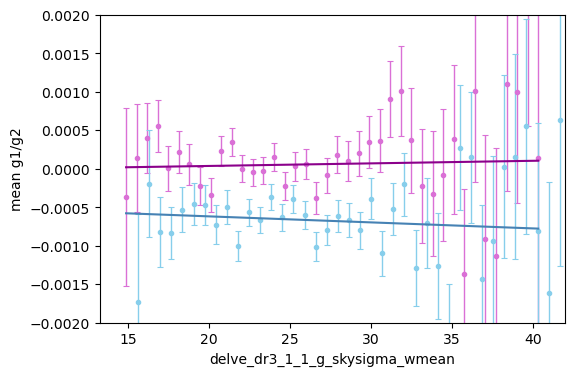

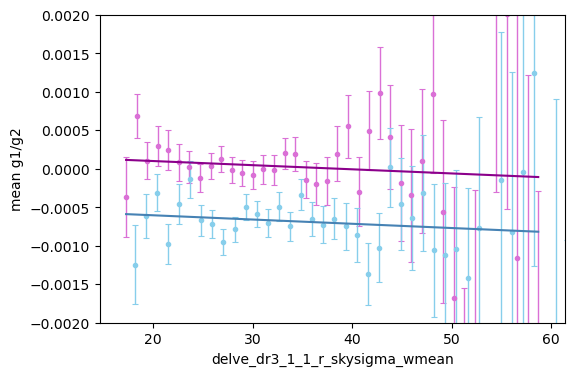

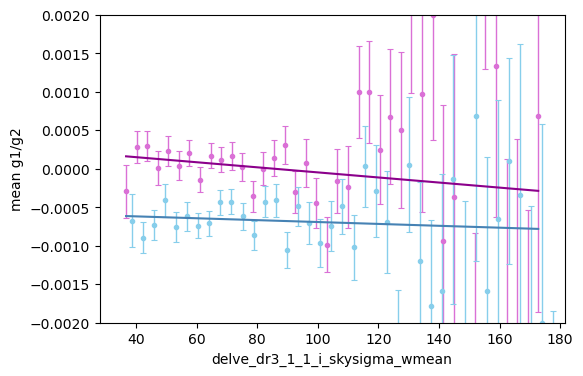

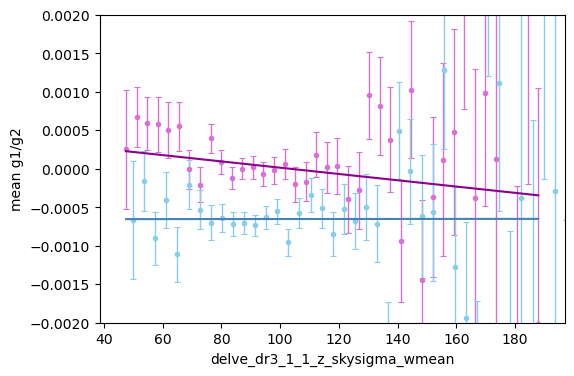

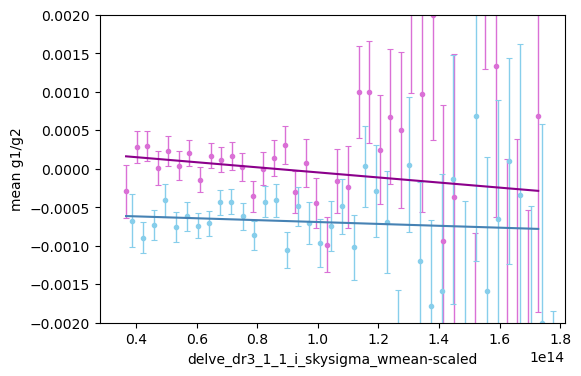

In [106]:
Types = ['airmass', 'dcr', 'exptime', 'fwhm', 'maglim', 'nexp', 'skybrite', 'skysigma']

LineFit = {}

import os
for SP in Types:
    file_list = os.listdir('/project/chihway/data/decade/SP_maps/'+SP)   
    for file_name in file_list:
        if file_name.endswith('.fits'):
            SP_map = hp.read_map('/project/chihway/data/decade/SP_maps/'+SP+'/'+file_name)      
            SP_map = hp.reorder(SP_map, n2r = True)            
            b1, a1, cov1, b2, a2, cov2 = SP_vs_shear(g1, g2, SP_map, ncount, file_name[:-5])
            LineFit[file_name[:-5]] = (b1, a1, cov1, b2, a2, cov2)

In [107]:
LineFit['delve_dr3_1_1_r_airmass_wmean'][2]

array([[ 5.24203865e-08, -7.49523512e-08],
       [-7.49523512e-08,  1.09760024e-07]])

In [109]:
import pickle

with open("SPmap_linefit.pk", "wb") as file_pk:
    pickle.dump(LineFit, file_pk)

In [114]:
with open("SPmap_linefit.pk", "rb") as file_pk:
    LineFit_read = pickle.load(file_pk)


In [115]:
LineFit_read

{'delve_dr3_1_1_r_airmass_wmean': (0.00014724355305547858,
  -0.00016504759501420068,
  array([[ 5.24203865e-08, -7.49523512e-08],
         [-7.49523512e-08,  1.09760024e-07]]),
  -0.00014487258410960708,
  -0.0004501054017420081,
  array([[ 6.77552043e-08, -9.68828958e-08],
         [-9.68828958e-08,  1.41877972e-07]])),
 'delve_dr3_1_1_g_airmass_wmean': (3.5076615832713316e-05,
  2.962914251011959e-06,
  array([[ 4.39475787e-08, -6.09511456e-08],
         [-6.09511456e-08,  8.71608397e-08]]),
  -0.0001890334033872803,
  -0.00039219201788524773,
  array([[ 4.21969732e-08, -5.85159350e-08],
         [-5.85159350e-08,  8.36667679e-08]])),
 'delve_dr3_1_1_i_airmass_wmean': (9.52243983557398e-05,
  -8.920900954405922e-05,
  array([[ 8.11971480e-08, -1.12379911e-07],
         [-1.12379911e-07,  1.59760729e-07]]),
  -0.00032502229158598046,
  -0.0002033564724578992,
  array([[ 3.52847303e-08, -4.88353428e-08],
         [-4.88353428e-08,  6.94243121e-08]])),
 'delve_dr3_1_1_z_airmass_wmean':

In [119]:
list_plot = ['delve_dr3_1_1_i_maglim_wmean', 'delve_dr3_1_1_i_skybrite_wmean', 'delve_dr3_1_1_i_exptime_sum', 'delve_dr3_1_1_i_airmass_wmean', 'delve_dr3_1_1_i_fwhm_wmean']
sp_title = ['Depth i', 'Brightness i', 'Exp time i', 'Airmass i', 'Seeing i']

Y1 = []
Y2 = []
for i in range(len(list_plot)):
    out = LineFit_read[list_plot[i]]
    y1 = out[0]/out[2][0][0]**0.5
    y2 = out[3]/out[5][0][0]**0.5
    Y1.append(y1)
    Y2.append(y2)

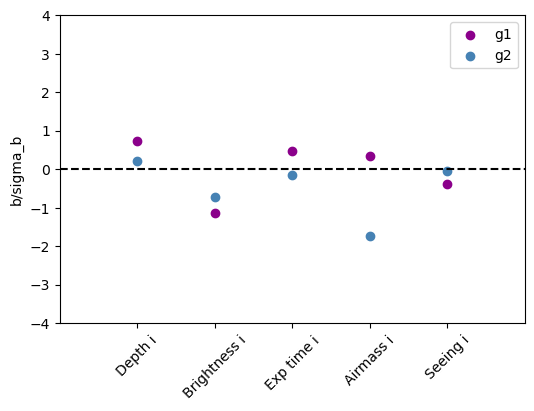

In [136]:
mplot.figure(figsize=(6,4))
ax = mplot.subplot(111)
mplot.scatter(np.arange(5), Y1, color='darkmagenta', label='g1')
mplot.scatter(np.arange(5), Y2, color='steelblue', label='g2')
mplot.plot([-1,5], [0,0], ls='--', color='k')
mplot.ylim(-4,4)
mplot.xlim(-1,5)
mplot.ylabel('b/sigma_b')
x = [0,1,2,3,4]
ax.set_xticks(x)
ax.set_xticklabels(sp_title, minor=False, rotation=45)
mplot.legend()

mplot.savefig('SP_g.pdf', bbox_inches='tight')